In [1]:
!mkdir ../checkpoints
!wget https://open-mmlab.s3.ap-northeast-2.amazonaws.com/mmsegmentation/models/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth -P ../checkpoints

mkdir: cannot create directory ‘../checkpoints’: File exists
--2020-07-07 08:54:25--  https://open-mmlab.s3.ap-northeast-2.amazonaws.com/mmsegmentation/models/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth
Resolving open-mmlab.s3.ap-northeast-2.amazonaws.com (open-mmlab.s3.ap-northeast-2.amazonaws.com)... 52.219.58.55
Connecting to open-mmlab.s3.ap-northeast-2.amazonaws.com (open-mmlab.s3.ap-northeast-2.amazonaws.com)|52.219.58.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 196205945 (187M) [application/x-www-form-urlencoded]
Saving to: ‘../checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth.1’

pspnet_r50-d8_512x1 100%[===================>] 187.12M  16.5MB/s    in 13s     

2020-07-07 08:54:38 (14.8 MB/s) - ‘../checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth.1’ saved [196205945/196205945]



In [1]:
from mmseg.apis import init_segmentor, inference_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette, get_classes, mean_iou
import mmcv
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image
import torch

In [2]:
configs = [
    {
        'name': 'swin',
        'config_file': 'configs/swin/upernet_swin_tiny_patch4_window7_512x512_160k_ade20k.py',
        'checkpoint_file': 'checkpoints/upernet_swin_tiny_patch4_window7_512x512.pth'
    },
        {
        'name': 'ann',
        'config_file': 'configs/ann/ann_r50-d8_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/ann_r50-d8_512x512_80k_ade20k_20200615_014818-26f75e11.pth'
    },
        {
        'name': 'deeplabv3plus_resnet',
        'config_file': 'configs/deeplabv3plus/deeplabv3plus_r50-d8_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/deeplabv3plus_r50-d8_512x512_80k_ade20k_20200614_185028-bf1400d8.pth'
    },
    {
        'name': 'deeplabv3plus_mobile',
        'config_file': 'configs/mobilenet_v2/deeplabv3plus_m-v2-d8_512x512_160k_ade20k.py',
        'checkpoint_file': 'checkpoints/deeplabv3plus_m-v2-d8_512x512_160k_ade20k_20200825_223255-465a01d4.pth'
    },
    {
        'name': 'hrnet',
        'config_file': 'configs/hrnet/fcn_hr18s_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/fcn_hr18s_512x512_80k_ade20k_20200614_144345-77fc814a.pth'
    },
    {
        'name': 'fcn_mobile',
        'config_file': 'configs/mobilenet_v2/fcn_m-v2-d8_512x512_160k_ade20k.py',
        'checkpoint_file': 'checkpoints/fcn_m-v2-d8_512x512_160k_ade20k_20200825_214953-c40e1095.pth'
    },
    {
        'name': 'fcn_resnet',
        'config_file': 'configs/fcn/fcn_r50-d8_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/fcn_r50-d8_512x512_80k_ade20k_20200614_144016-f8ac5082.pth'
    },
    {
        'name': 'fpn_resnet',
        'config_file': 'configs/sem_fpn/fpn_r101_512x512_160k_ade20k.py',
        'checkpoint_file': 'checkpoints/fpn_r101_512x512_160k_ade20k_20200718_131734-306b5004.pth'
    },
    {
        'name': 'gcnet',
        'config_file': 'configs/gcnet/gcnet_r50-d8_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/gcnet_r50-d8_512x512_80k_ade20k_20200614_185146-91a6da41.pth'
    },
    {
        'name': 'pspnet',
        'config_file': 'configs/pspnet/pspnet_r50-d8_512x512_80k_ade20k.py',
        'checkpoint_file': 'checkpoints/pspnet_r50-d8_512x512_80k_ade20k_20200615_014128-15a8b914.pth'
    },
    
]

In [5]:
floor_idx = get_classes('ade').index("floor")
wall_idx = get_classes('ade').index("wall") + 10
demo_dir = 'demo/demo'
base_result_dir = 'demo/result_demo/'
palette = get_palette('ade')
for config in configs:
    name = config['name']
    result_dir = os.path.join(base_result_dir, name)
    config_file = config['config_file']
    checkpoint_file = config['checkpoint_file']
    !mkdir demo/result_demo/$name 
    !python tools/test.py $config_file $checkpoint_file --eval mIoU > demo/result_demo/$name/test.txt  
    !python tools/benchmark.py $config_file $checkpoint_file > demo/result_demo/$name/fps.txt  
    model = init_segmentor(config_file, checkpoint_file, device='cuda:0')
    index = 1
    for img in os.listdir(demo_dir):
        if img.endswith('.jpg'):
            orig_img = mmcv.imread(os.path.join(demo_dir, img), channel_order='rgb')
            mmcv.imwrite(orig_img[...,::-1], os.path.join(result_dir,  f'{index}_1.jpg'))
            result = inference_segmentor(model, orig_img)[0]
            result[result == 0] = 10
            result = np.array([result])
            #floor_wall
            result_floor = np.where(np.logical_or(result[0]==floor_idx, result[0]==wall_idx), result[0], 0)
            mmcv.imwrite(result_floor, os.path.join(result_dir,  f'{index}_mask.png'))
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_2.jpg'))
            #wall
            result_floor = np.where(result[0]==wall_idx, result[0], 0)
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_3.jpg'))
            #floor
            result_floor = np.where(result[0]==floor_idx, result[0], 0)
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_4.jpg'))
            index+=1
    model.cpu
    del model
    torch.cuda.empty_cache()

mkdir: cannot create directory ‘demo/result_demo/swin’: File exists
2021-07-15 18:18:20,739 - mmseg - INFO - Loaded 2000 images
Traceback (most recent call last):
  File "tools/test.py", line 148, in <module>
    main()
  File "tools/test.py", line 124, in main
    model = MMDataParallel(model, device_ids=[0])
  File "/home/user/anaconda3/envs/sentimentanalysis/lib/python3.8/site-packages/mmcv/parallel/data_parallel.py", line 27, in __init__
    super(MMDataParallel, self).__init__(*args, dim=dim, **kwargs)
  File "/home/user/anaconda3/envs/sentimentanalysis/lib/python3.8/site-packages/torch/nn/parallel/data_parallel.py", line 145, in __init__
    self.module.to(self.src_device_obj)
  File "/home/user/anaconda3/envs/sentimentanalysis/lib/python3.8/site-packages/torch/nn/modules/module.py", line 673, in to
    return self._apply(convert)
  File "/home/user/anaconda3/envs/sentimentanalysis/lib/python3.8/site-packages/torch/nn/modules/module.py", line 387, in _apply
    module._apply(fn)


RuntimeError: CUDA out of memory. Tried to allocate 50.00 MiB (GPU 0; 9.78 GiB total capacity; 593.55 MiB already allocated; 25.44 MiB free; 620.00 MiB reserved in total by PyTorch)

In [7]:
# build the model from a config file and a checkpoint file
print(model)



NameError: name 'model' is not defined

mkdir: cannot create directory ‘demo/result_demo/swin’: File exists
2021-07-12 16:45:03,282 - mmseg - INFO - Loaded 2000 images
Use load_from_local loader


/home/user/Luxoft/Swin-Transformer-Semantic-Segmentation-main/mmseg/core/evaluation/metrics.py:215: RuntimeWarning: invalid value encountered in true_divide
  acc = total_area_intersect / total_area_label
/home/user/Luxoft/Swin-Transformer-Semantic-Segmentation-main/mmseg/core/evaluation/metrics.py:219: RuntimeWarning: invalid value encountered in true_divide
  iou = total_area_intersect / total_area_union


2021-07-12 16:48:24,043 - mmseg - INFO - Loaded 2000 images
Use load_from_local loader


/tmp/ipykernel_22361/3475836015.py:85: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(1,2)


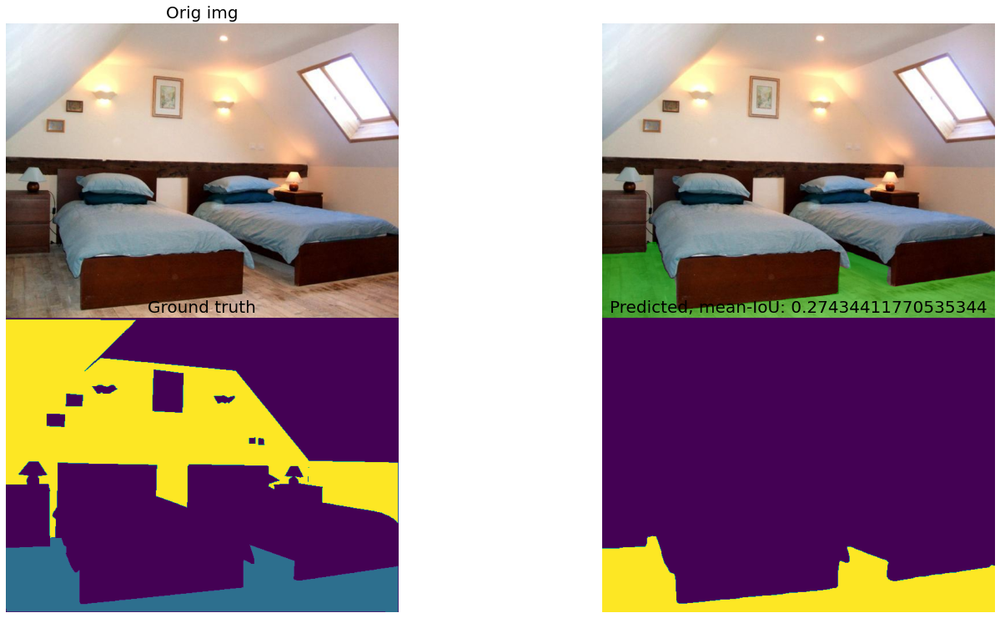

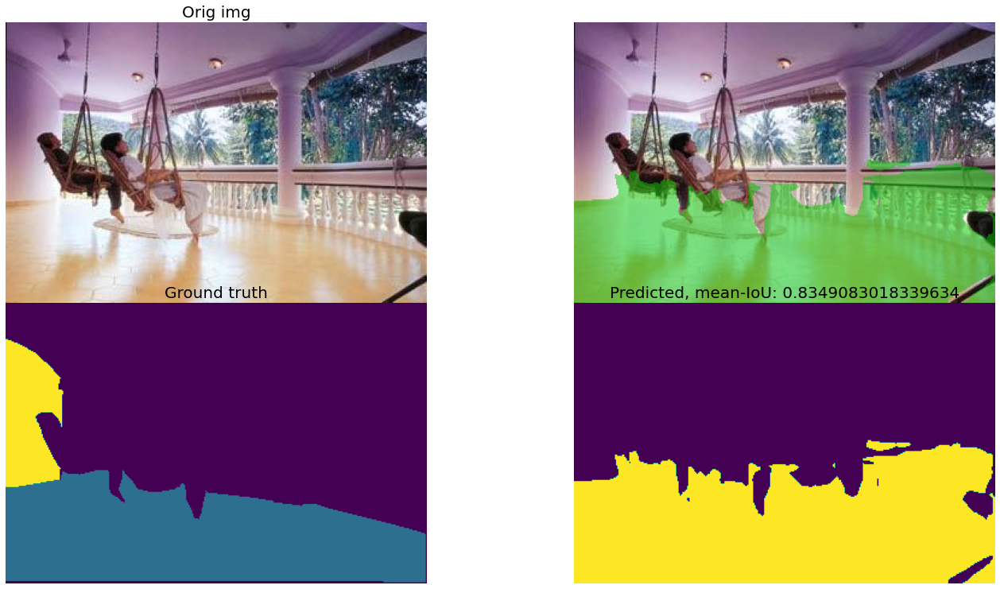

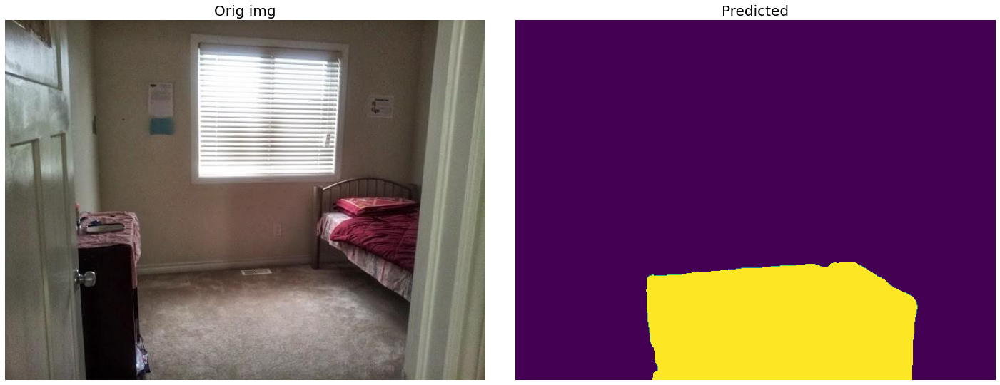

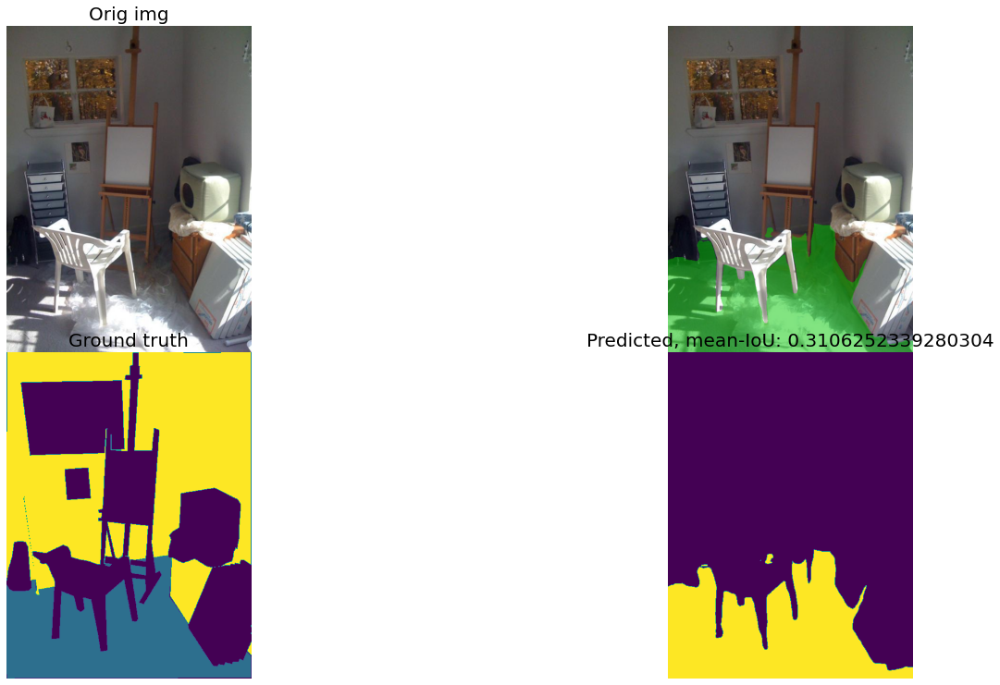

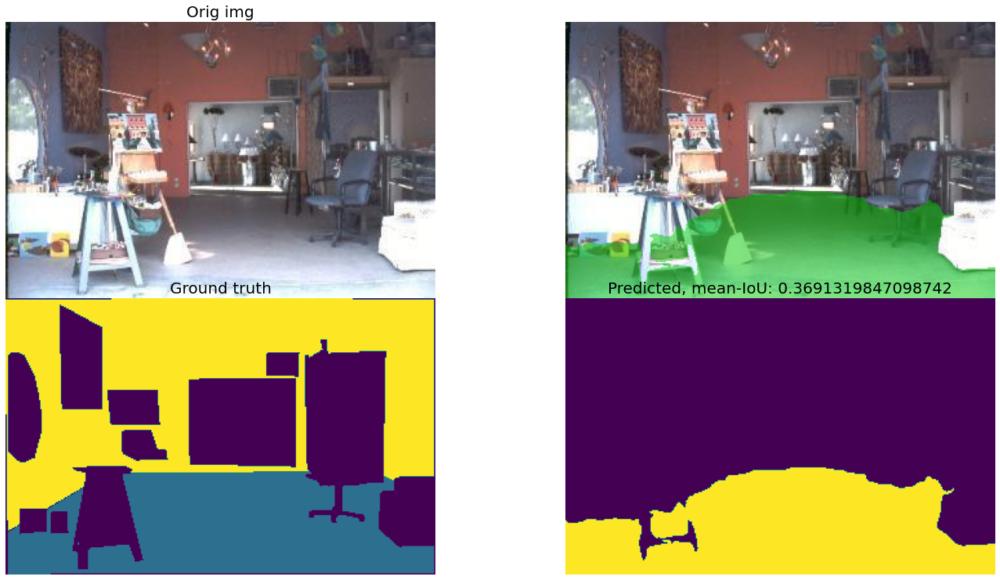

...

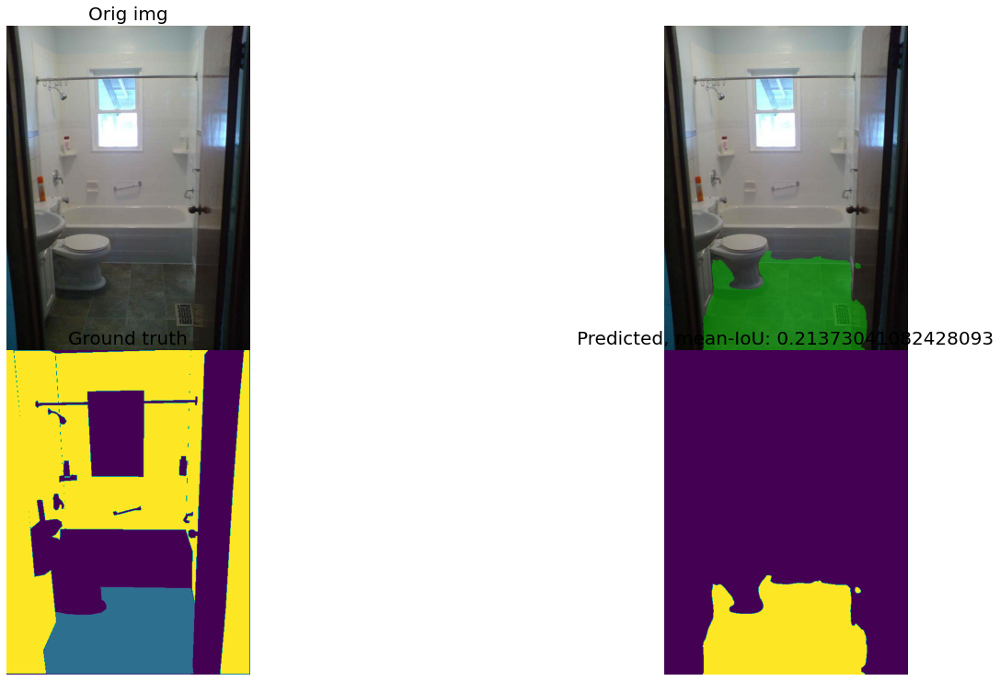

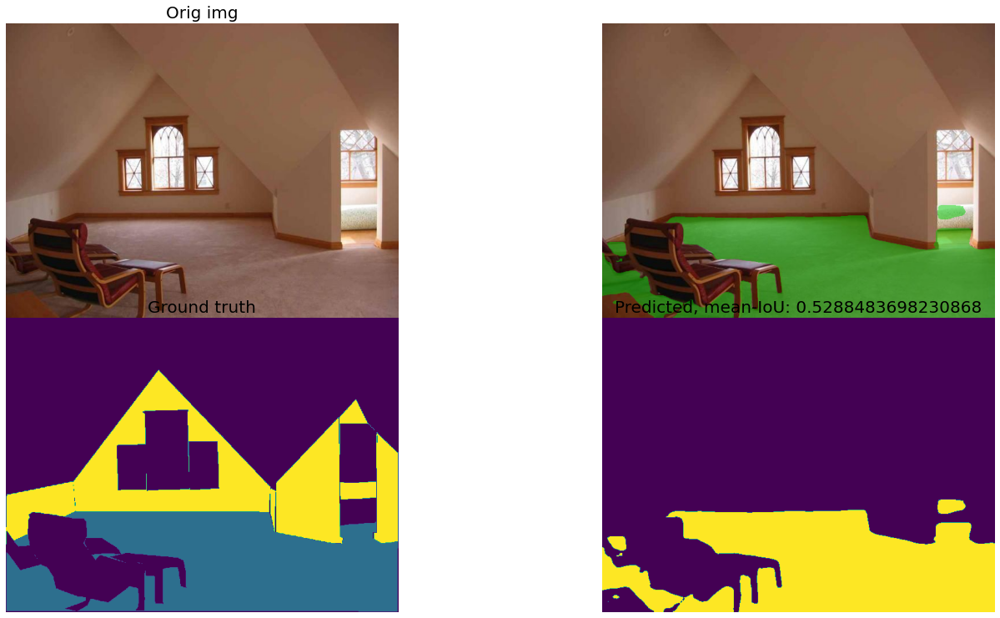

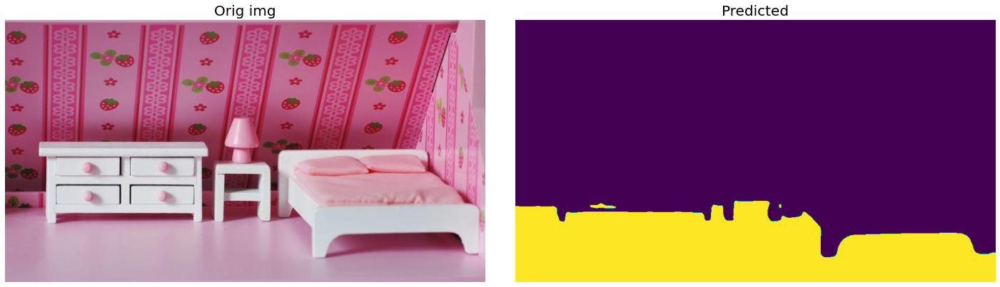

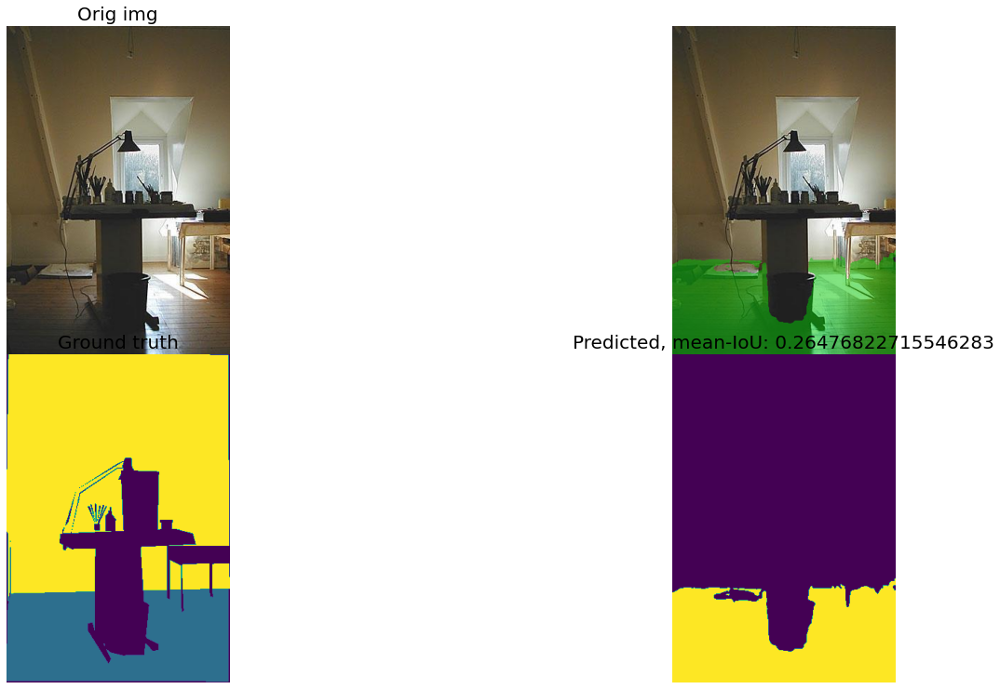

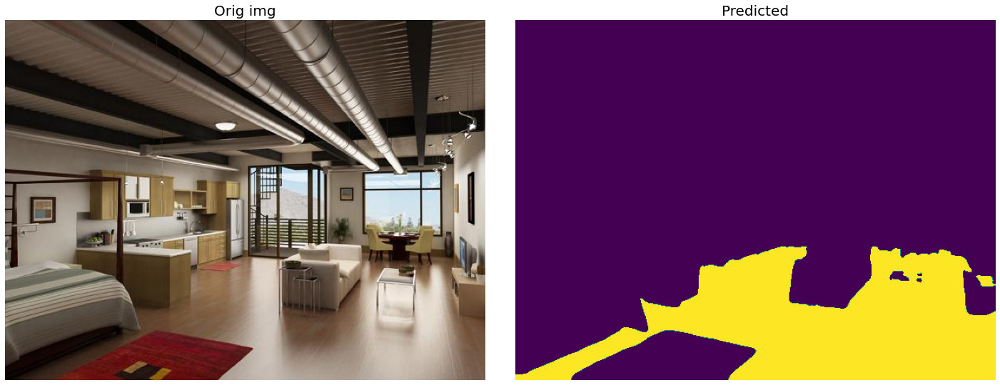

In [3]:
floor_idx = get_classes('ade').index("floor")
wall_idx = get_classes('ade').index("wall") + 10
demo_dir = 'demo/demo'
base_result_dir = 'demo/result_demo/'
palette = get_palette('ade')
for config in configs:
    name = config['name']
    result_dir = os.path.join(base_result_dir, name)
    config_file = config['config_file']
    checkpoint_file = config['checkpoint_file']
    !mkdir demo/result_demo/$name 
    !python tools/test.py $config_file $checkpoint_file --eval mIoU > demo/result_demo/$name/test.txt  
    model = init_segmentor(config_file, checkpoint_file, device='cuda:0')
    index = 1
    for img in os.listdir(demo_dir):
        if img.endswith('.jpg'):
            orig_img = mmcv.imread(os.path.join(demo_dir, img), channel_order='rgb')
            mmcv.imwrite(orig_img[...,::-1], os.path.join(result_dir,  f'{index}_1.jpg'))
            result = inference_segmentor(model, orig_img)[0]
            result[result == 0] = 10
            result = np.array([result])
            #floor_wall
            result_floor = np.where(np.logical_or(result[0]==floor_idx, result[0]==wall_idx), result[0], 0)
            mmcv.imwrite(result_floor[...,::-1], os.path.join(result_dir,  f'{index}_mask.png'))
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_2.jpg'))
            #wall
            result_floor = np.where(result[0]==wall_idx, result[0], 0)
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_3.jpg'))
            #floor
            result_floor = np.where(result[0]==floor_idx, result[0], 0)
            alpha_mask = ((result_floor>0) * 255/2).astype(int)
            result_floor_with_palette = np.zeros((result_floor.shape[0], result_floor.shape[1], 4), dtype=np.uint8)
            for label, color in enumerate(palette):
                result_floor_with_palette[result_floor == label-1, :3] = color
            result_floor_with_palette[:,:,-1] = alpha_mask
            result_floor_with_palette = Image.alpha_composite(
                Image.fromarray(np.uint8(orig_img)).convert('RGBA'), 
                Image.fromarray(np.uint8(result_floor_with_palette)).convert('RGBA')).convert('RGB')
            mmcv.imwrite(np.array(result_floor_with_palette)[...,::-1], os.path.join(result_dir,  f'{index}_4.jpg'))
            try:
                seg_img_path = img.replace('.jpg', '.png')
                seg_img = mmcv.imread(os.path.join(demo_dir, seg_img_path), flag='unchanged',backend='pillow')
                seg_img[seg_img == 1] = 11
                seg_img_floor = np.where(np.logical_or(seg_img==floor_idx+1, seg_img==wall_idx+1), seg_img, 0)
                mIoU = mean_iou([result_floor.copy()], [seg_img_floor.copy()], 
                                num_classes=len(get_classes('ade')), ignore_index=255, reduce_zero_label=True)[0]

            except FileNotFoundError:
                seg_img = None
            if seg_img is not None:
                f, axarr = plt.subplots(2,2)
                f.set_figheight(20)
                f.set_figwidth(20)
                f.tight_layout()

                axarr[0][0].imshow(orig_img)
                axarr[0][0].set_title('Orig img', fontsize = 20)
                axarr[0][0].axis('off')
                axarr[0][1].imshow(result_floor_with_palette)
                axarr[0][1].axis('off')
                axarr[1][0].imshow(seg_img_floor)
                axarr[1][0].set_title('Ground truth', fontsize = 20) 
                axarr[1][0].axis('off')
                axarr[1][1].imshow(result_floor)
                axarr[1][1].set_title(f'Predicted, mean-IoU: {mIoU}', fontsize = 20)
                axarr[1][1].axis('off')
                plt.subplots_adjust(hspace = .001, bottom=0.01, top=0.5)
            else:
                f, axarr = plt.subplots(1,2)
                f.set_figheight(20)
                f.set_figwidth(20)
                f.tight_layout()
                axarr[0].imshow(orig_img)
                axarr[0].set_title('Orig img', fontsize = 20)
                axarr[0].axis('off')
                axarr[1].imshow(result_floor)
                axarr[1].set_title(f'Predicted', fontsize = 20)
                axarr[1].axis('off')
                plt.subplots_adjust(hspace = .001, bottom=0.01, top=0.75)
            index+=1
    model.cpu
    del model, result, orig_img, mIoU,result_floor, seg_img_floor
    torch.cuda.empty_cache()

In [18]:
# test a single image
img = 'ADE_val_00000118.jpg'
orig_img = mmcv.imread(img, channel_order='rgb')
gt_seg = 'ADE_val_00000118.png'
gt_seg = mmcv.imread(gt_seg, flag='unchanged',backend='pillow')
result = inference_segmentor(model, img)
floor = np.where(result[0]==3, result[0], 255)
gt_floor = np.where(gt_seg==4, gt_seg, 255)

(450, 600, 3)


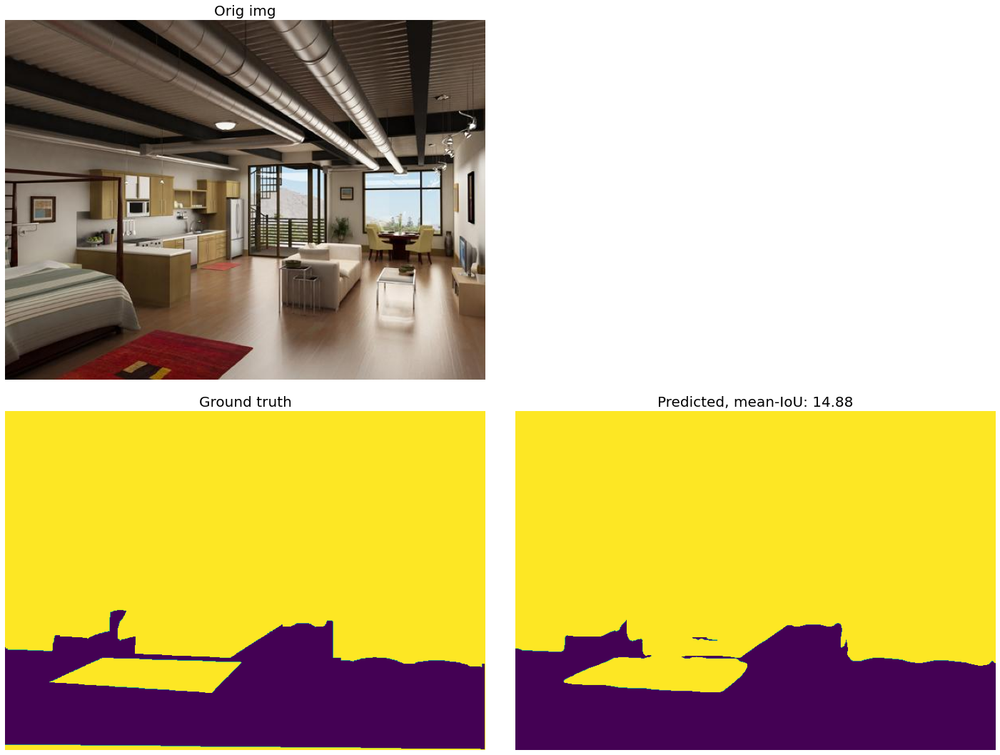

In [218]:
print(orig_img.shape)
f, axarr = plt.subplots(2,2)
f.set_figheight(20)
f.set_figwidth(20)
f.tight_layout()
axarr[0][0].imshow(orig_img)
axarr[0][0].set_title('Orig img', fontsize = 20)
axarr[0][0].axis('off')
axarr[0][1].axis('off')
axarr[1][0].imshow(gt_floor)
axarr[1][0].set_title('Ground truth', fontsize = 20) 
axarr[1][0].axis('off')
axarr[1][1].imshow(floor)
axarr[1][1].set_title(f'Predicted, mean-IoU: {1}', fontsize = 20)
axarr[1][1].axis('off')
plt.subplots_adjust(hspace = .001, bottom=0.01, top=0.75)




In [34]:
print(np.array(Image.fromarray(np.uint8(seg_img_floor)).convert('RGBA'))[:,:,3])

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3]])]


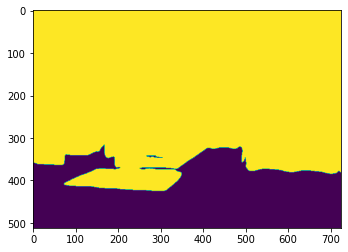

In [136]:
print(result)
plt.imshow(floor)

/home/user/Luxoft/Swin-Transformer-Semantic-Segmentation-main/mmseg/models/segmentors/base.py:267: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


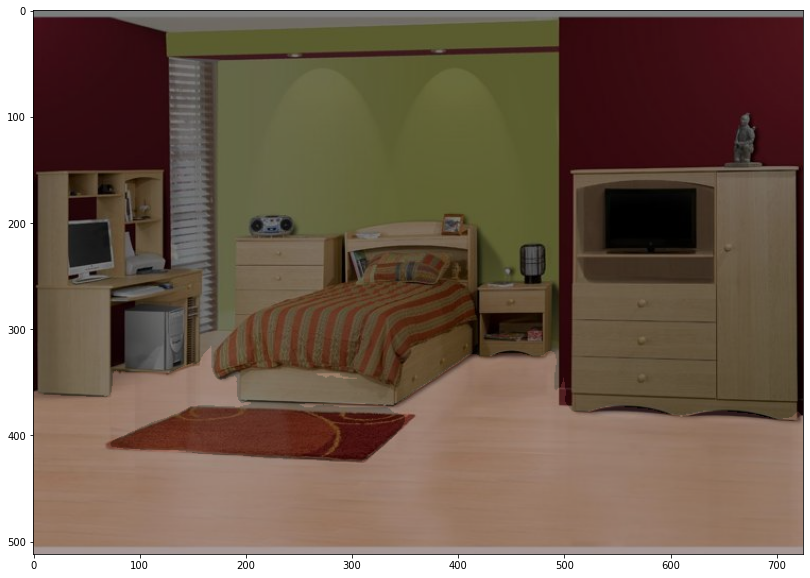

In [20]:
# show the results
show_result_pyplot(model, img, [floor], get_palette('ade'))

In [121]:
print(result)

[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3]])]


In [139]:
mean_iou([floor], [gt_floor], num_classes=len(get_classes('ade')), ignore_index=255, reduce_zero_label=True)

/home/user/Luxoft/Swin-Transformer-Semantic-Segmentation-main/mmseg/core/evaluation/metrics.py:215: RuntimeWarning: invalid value encountered in true_divide
  acc = total_area_intersect / total_area_label
/home/user/Luxoft/Swin-Transformer-Semantic-Segmentation-main/mmseg/core/evaluation/metrics.py:219: RuntimeWarning: invalid value encountered in true_divide
  iou = total_area_intersect / total_area_union


(0.9774576689133652,
 array([       nan,        nan,        nan, 0.97745767,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        

In [16]:
get_classes('ade').index("floor")

3

In [58]:
result

[array([[ 5,  5,  5, ...,  5,  5,  5],
        [ 5,  5,  5, ...,  5,  5,  5],
        [ 5,  5,  5, ...,  5,  5,  5],
        ...,
        [19, 19, 19, ...,  3,  3,  3],
        [19, 19, 19, ...,  3,  3,  3],
        [19, 19, 19, ...,  3,  3,  3]])]

In [10]:
for i in result[0]:
    print(i)

[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[ 1  1 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1]
[93 93 93 ...  1  1  1

In [45]:
import mmcv
from mmseg.datasets import build_dataloader, build_dataset
cfg = mmcv.Config.fromfile(config_file)

In [128]:
dataset = build_dataset(cfg.data.val)

2021-07-06 16:58:32,295 - mmseg - INFO - Loaded 2000 images


In [60]:
cfg.data.val['data_root'] = '../data/ade/ADEChallengeData2016'

In [130]:
print(dataset.label_map)

None


In [126]:
imgs

In [102]:
import inspect
print(inspect.getsource(mmcv.imwrite))

def imwrite(img, file_path, params=None, auto_mkdir=True):
    """Write image to file.

    Args:
        img (ndarray): Image array to be written.
        file_path (str): Image file path.
        params (None or list): Same as opencv's :func:`imwrite` interface.
        auto_mkdir (bool): If the parent folder of `file_path` does not exist,
            whether to create it automatically.

    Returns:
        bool: Successful or not.
    """
    if auto_mkdir:
        dir_name = osp.abspath(osp.dirname(file_path))
        mkdir_or_exist(dir_name)
    return cv2.imwrite(file_path, img, params)



In [137]:
dataset.reduce_zero_label

True

In [ ]:
sda